In [1]:
# importing basic libraries
import numpy as np
import pandas as pd
from collections import Counter

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy import stats
from scipy.stats import norm, skew

# for data analysis
import pandas_profiling as profile
import dabl

# for data visualization
import seaborn as sns
import matplotlib.pyplot as plt

# for interactive data analysis
import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interact_manual

# for statistics
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy import stats
from scipy.stats import norm, skew


In [2]:
# lets read the dataset
data = pd.read_csv('faults.csv')

# check the head of the dataset
pd.set_option('max_columns', 100)
data.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


In [3]:
# lets check the shape of the dataset
data.shape

(1941, 34)

In [4]:
# lets check the columns of the dataset
data.columns

Index(['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas', 'Pastry', 'Z_Scratch', 'K_Scatch', 'Stains',
       'Dirtiness', 'Bumps', 'Other_Faults'],
      dtype='object')

In [5]:
# lets check the sample of the dataset
data.sample(5)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
657,39,211,2212076,2212144,6249,263,137,649801,39,124,1358,0,1,40,0.0574,0.4657,0.3954,0.1267,0.6540,0.4963,0.0,3.7958,2.2355,1.8325,-0.6047,-0.1876,1.0000,0,0,1,0,0,0,0
770,323,334,367324,367330,28,11,7,3576,120,135,1358,0,1,50,0.4757,0.5758,0.5454,0.0081,1.0000,0.8571,0.0,1.4472,1.0414,0.7782,-0.4545,-0.0022,0.1715,0,0,0,1,0,0,0
1581,0,14,1007200,1007319,996,45,120,78978,59,106,1687,1,0,80,0.0000,0.4022,0.1177,0.0083,0.3111,0.9917,1.0,2.9983,1.1461,2.0756,0.8824,-0.3805,0.9999,0,0,0,0,0,0,1
1107,979,992,724192,724202,59,15,11,7330,112,141,1360,0,1,175,0.5412,0.5462,0.7692,0.0096,0.8667,0.9091,0.0,1.7708,1.1139,1.0000,-0.2308,-0.0294,0.2408,0,0,0,0,0,1,0
155,13,21,1488612,1488636,105,18,24,13943,120,150,1358,1,0,70,0.0192,0.4531,0.3333,0.0059,0.4444,1.0000,1.0,2.0212,0.9031,1.3802,0.6667,0.0374,0.3241,1,0,0,0,0,0,0


In [6]:
# lets check the profile of the data
profile.ProfileReport(data)

In [7]:
# lets check if there is any null data
data.isnull().sum()

X_Minimum                0
X_Maximum                0
Y_Minimum                0
Y_Maximum                0
Pixels_Areas             0
X_Perimeter              0
Y_Perimeter              0
Sum_of_Luminosity        0
Minimum_of_Luminosity    0
Maximum_of_Luminosity    0
Length_of_Conveyer       0
TypeOfSteel_A300         0
TypeOfSteel_A400         0
Steel_Plate_Thickness    0
Edges_Index              0
Empty_Index              0
Square_Index             0
Outside_X_Index          0
Edges_X_Index            0
Edges_Y_Index            0
Outside_Global_Index     0
LogOfAreas               0
Log_X_Index              0
Log_Y_Index              0
Orientation_Index        0
Luminosity_Index         0
SigmoidOfAreas           0
Pastry                   0
Z_Scratch                0
K_Scatch                 0
Stains                   0
Dirtiness                0
Bumps                    0
Other_Faults             0
dtype: int64

In [8]:
# lets check the info of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1941 entries, 0 to 1940
Data columns (total 34 columns):
X_Minimum                1941 non-null int64
X_Maximum                1941 non-null int64
Y_Minimum                1941 non-null int64
Y_Maximum                1941 non-null int64
Pixels_Areas             1941 non-null int64
X_Perimeter              1941 non-null int64
Y_Perimeter              1941 non-null int64
Sum_of_Luminosity        1941 non-null int64
Minimum_of_Luminosity    1941 non-null int64
Maximum_of_Luminosity    1941 non-null int64
Length_of_Conveyer       1941 non-null int64
TypeOfSteel_A300         1941 non-null int64
TypeOfSteel_A400         1941 non-null int64
Steel_Plate_Thickness    1941 non-null int64
Edges_Index              1941 non-null float64
Empty_Index              1941 non-null float64
Square_Index             1941 non-null float64
Outside_X_Index          1941 non-null float64
Edges_X_Index            1941 non-null float64
Edges_Y_Index            194

In [9]:
# lets check the basic statistics of the data
x = data.describe()
x.style.bar(color = 'gold',  align = 'mid')

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
count,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941,1941
mean,571.136,617.964,1.65068e+06,1.65074e+06,1893.88,111.855,82.966,206312,84.5487,130.194,1459.16,0.400309,0.599691,78.7378,0.331715,0.414203,0.570767,0.0333611,0.610529,0.813472,0.575734,2.49239,1.33569,1.40327,0.0832876,-0.131305,0.58542,0.0814013,0.0978877,0.201443,0.0370943,0.0283359,0.20711,0.346728
std,520.691,497.627,1.77458e+06,1.77459e+06,5168.46,301.209,426.483,512294,32.1343,18.691,144.578,0.490087,0.490087,55.086,0.299712,0.137261,0.271058,0.0589612,0.243277,0.234274,0.482352,0.78893,0.481612,0.454345,0.500868,0.148767,0.339452,0.273521,0.297239,0.401181,0.189042,0.165973,0.405339,0.476051
min,0,4,6712,6724,2,2,1,250,0,37,1227,0,0,40,0,0,0.0083,0.0015,0.0144,0.0484,0,0.301,0.301,0,-0.991,-0.9989,0.119,0,0,0,0,0,0,0
25%,51,192,471253,471281,84,15,13,9522,63,124,1358,0,0,40,0.0604,0.3158,0.3613,0.0066,0.4118,0.5968,0,1.9243,1,1.0792,-0.3333,-0.195,0.2482,0,0,0,0,0,0,0
50%,435,467,1.20413e+06,1.20414e+06,174,26,25,19202,90,127,1364,0,1,70,0.2273,0.4121,0.5556,0.0101,0.6364,0.9474,1,2.2406,1.1761,1.3222,0.0952,-0.133,0.5063,0,0,0,0,0,0,0
75%,1053,1072,2.18307e+06,2.18308e+06,822,84,83,83011,106,140,1650,1,1,80,0.5738,0.5016,0.8182,0.0235,0.8,1,1,2.9149,1.5185,1.7324,0.5116,-0.0666,0.9998,0,0,0,0,0,0,1
max,1705,1713,1.29877e+07,1.29877e+07,152655,10449,18152,1.15914e+07,203,253,1794,1,1,300,0.9952,0.9439,1,0.8759,1,1,1,5.1837,3.0741,4.2587,0.9917,0.6421,1,1,1,1,1,1,1,1


In [10]:
# lets check the correlation of the data
x = data.corr()
x.style.bar(color = ['silver', 'gold'],align = 'mid')

In [11]:
# lets check the covariance of the dataset
x = data.cov()
x.style.bar(color = ['silver', 'gold'], align = 'mid')

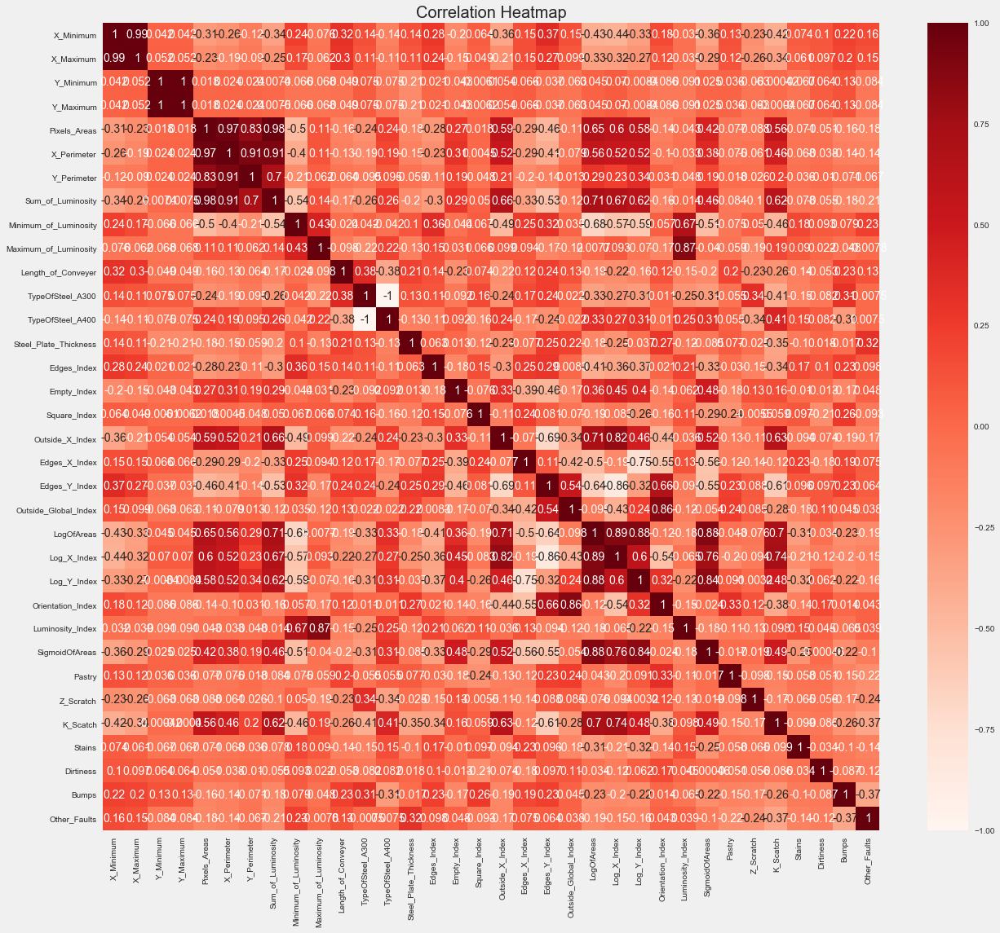

In [12]:
# lets check the heat maps for the dataset

plt.rcParams['figure.figsize'] = (19, 17)
plt.style.use('fivethirtyeight')

sns.heatmap(data.corr(),
            cmap = 'Reds',
            annot = True)
plt.title('Correlation Heatmap', fontsize = 20)
plt.show()

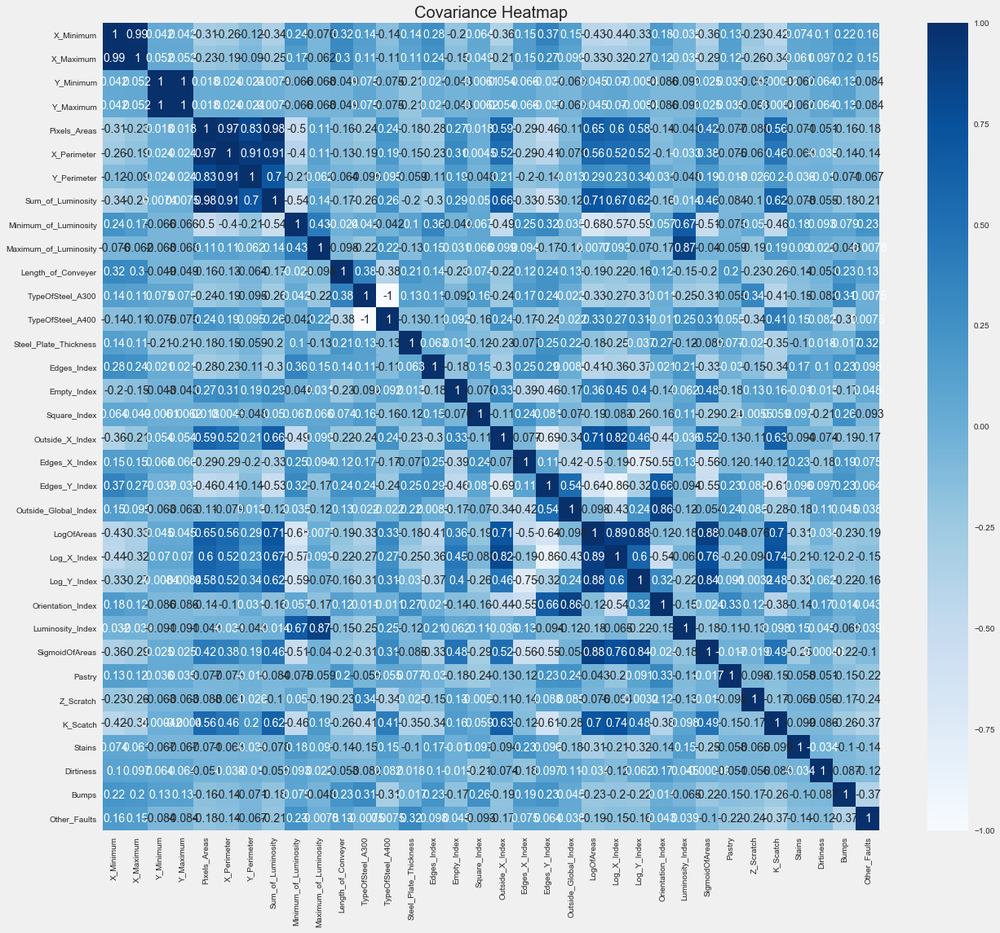

In [13]:
# lets check the heat maps for the dataset

plt.rcParams['figure.figsize'] = (19, 17)
plt.style.use('fivethirtyeight')

sns.heatmap(data.corr(),
            cmap = 'Blues',
            annot = True)
plt.title('Covariance Heatmap', fontsize = 20)
plt.show()

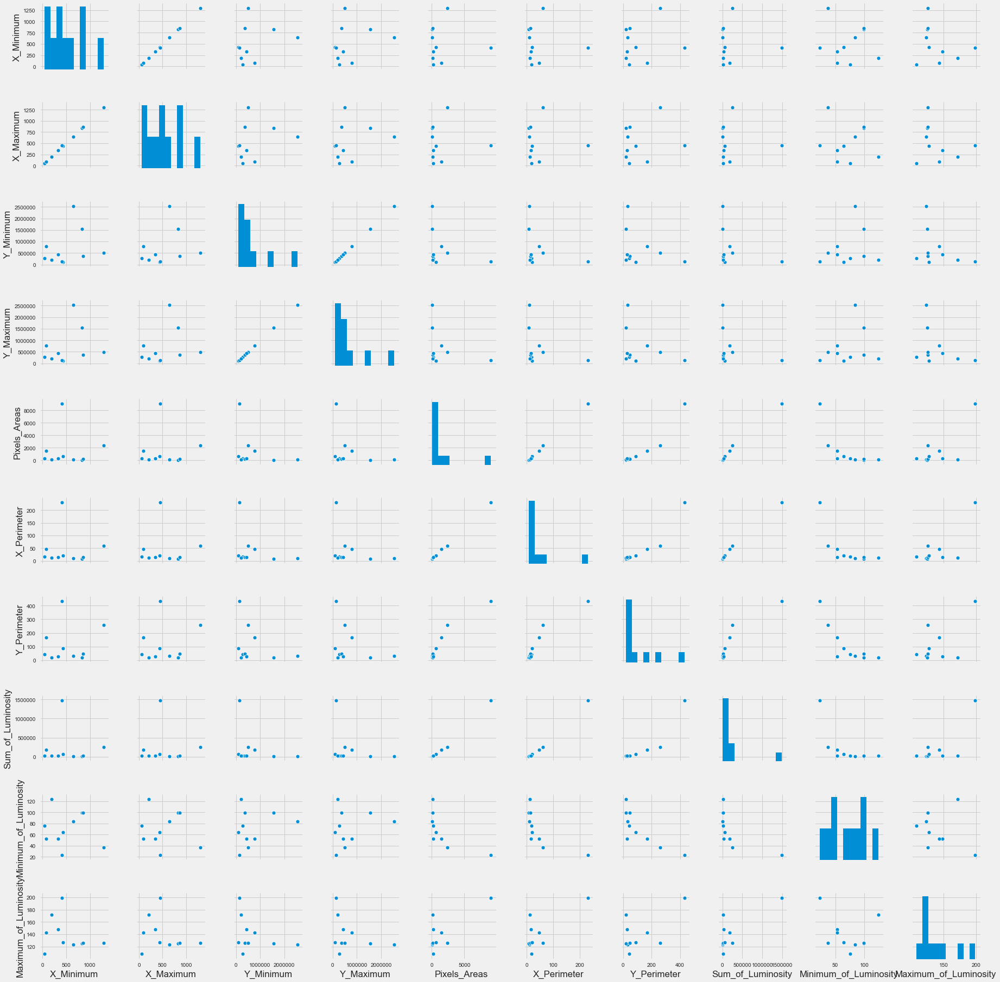

In [14]:
# lets check the pairplot for the data

sns.pairplot(data.iloc[:10,:10])
plt.show()

In [15]:
# lets check the complete analysis for the data
data_clean = dabl.clean(data, verbose=1)

Detected feature types:
13 float, 21 int, 0 object, 0 date, 0 other
Interpreted as:
continuous      24
dirty_float      0
low_card_int     1
categorical      7
date             0
free_string      0
useless          2
dtype: int64


In [16]:
# lets check them
types = dabl.detect_types(data_clean)
print(types) 


                       continuous  dirty_float  low_card_int  categorical  \
X_Minimum                    True        False         False        False   
X_Maximum                    True        False         False        False   
Y_Minimum                    True        False         False        False   
Y_Maximum                    True        False         False        False   
Pixels_Areas                 True        False         False        False   
X_Perimeter                  True        False         False        False   
Y_Perimeter                  True        False         False        False   
Sum_of_Luminosity            True        False         False        False   
Minimum_of_Luminosity        True        False         False        False   
Maximum_of_Luminosity        True        False         False        False   
Length_of_Conveyer           True        False         False        False   
TypeOfSteel_A300            False        False         False         True   

In [17]:
targets = data.iloc[:, 27:35]
data.drop(targets.columns, axis=1, inplace=True)
data['Target'] = targets.idxmax(1)
data.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Target
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,Pastry
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,Pastry
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,Pastry
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,Pastry
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,Pastry


In [18]:
# lets create a copy of this data
origina_data = data
origina_data.columns

Index(['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas', 'Target'],
      dtype='object')

Target looks like classification
Showing only top 10 of 24 continuous features
Linear Discriminant Analysis training set score: 0.673


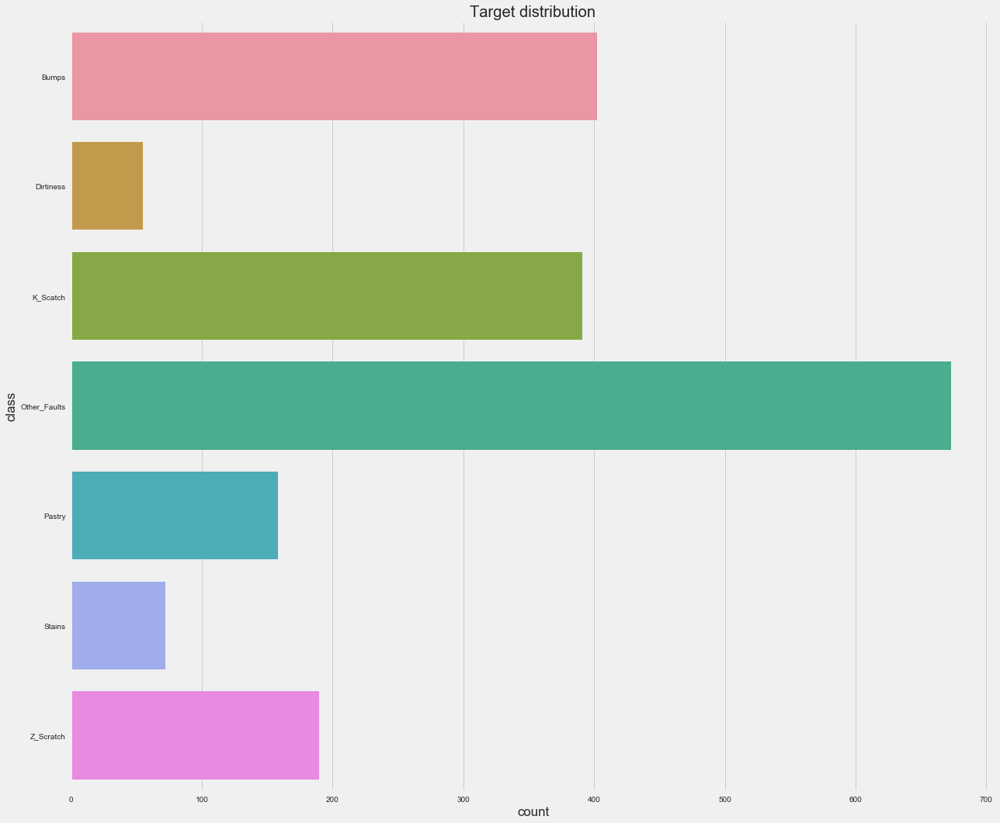

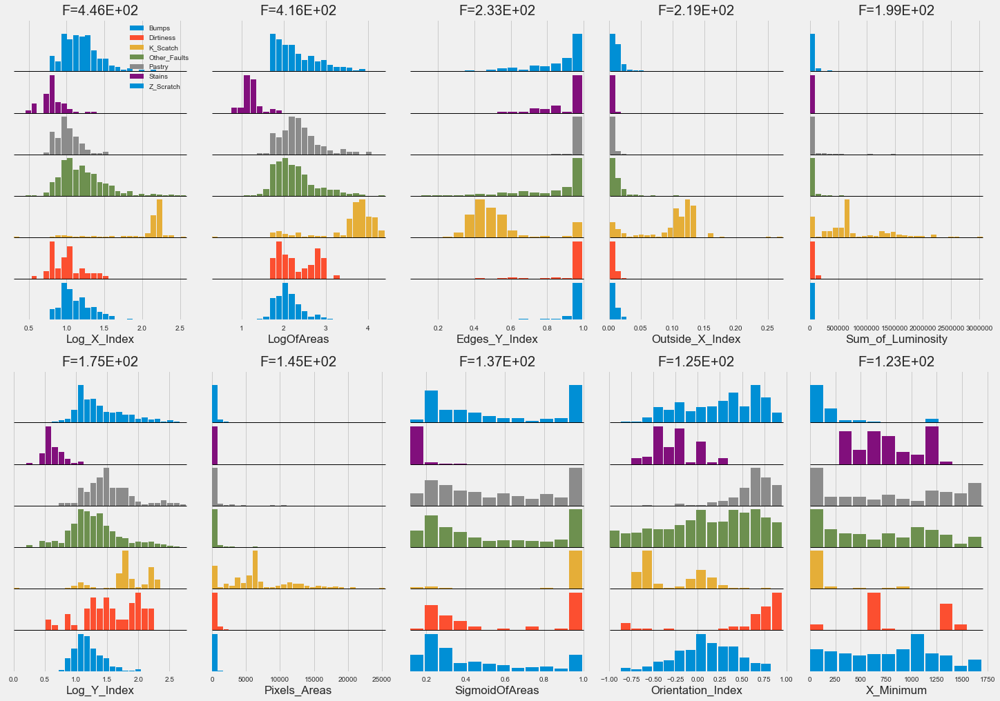

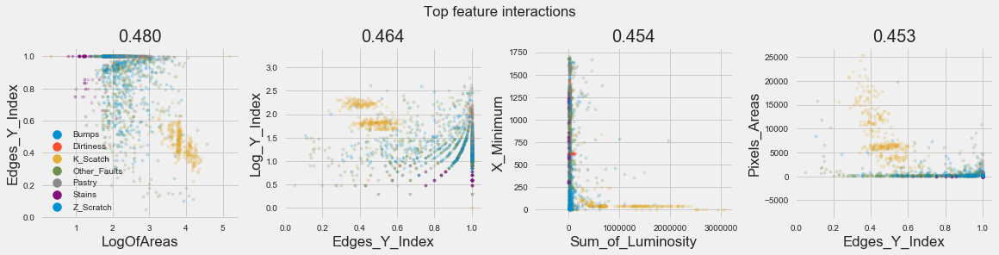

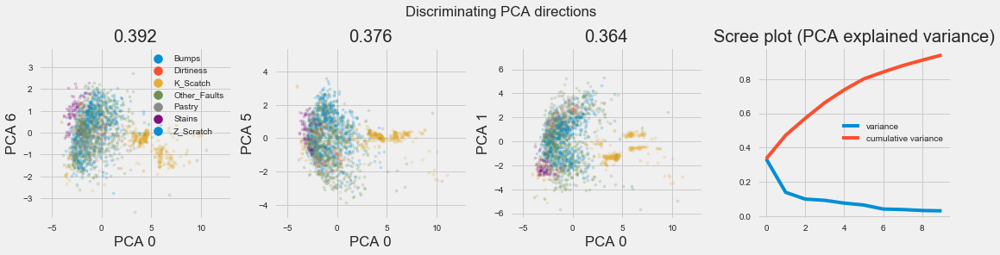

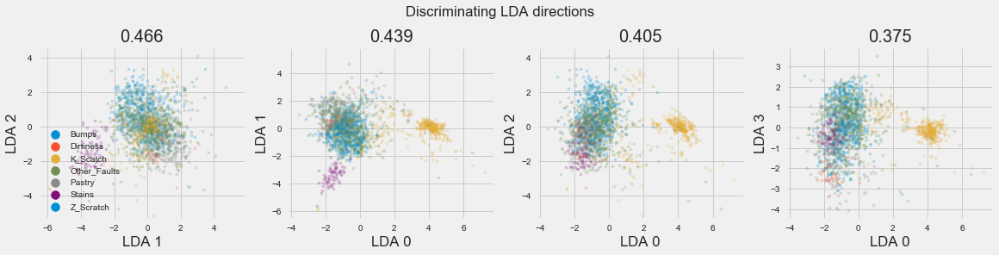

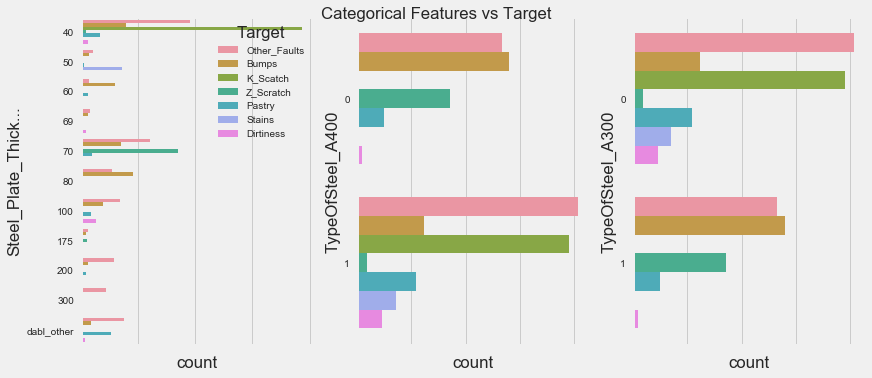

In [19]:
dabl.plot(data, target_col='Target')

In [20]:
data['TypeOfSteel_A300'] = data['TypeOfSteel_A300'].astype('category',copy=False)
data['TypeOfSteel_A400'] = data['TypeOfSteel_A400'].astype('category',copy=False)
data['Outside_Global_Index'] = data['Outside_Global_Index'].astype('category',copy=False)

In [21]:
# lets create a interactive visualization to check the reg plot

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = data.select_dtypes('number').columns,
          column2 = data.select_dtypes('number').columns[1:],
          color = ['red','black','green','blue']):
    sns.regplot(data[column1], data[column2], color = color)
    plt.show()

interactive(children=(Dropdown(description='column1', options=('X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maxim…

In [22]:
## Feature Skewness

In [23]:

numeric_features = data.dtypes[data.dtypes != "object"].index

skewed_features = data[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)

skewed_features_df = pd.DataFrame(skewed_features, columns={'Skew'})
skewed_features_df.head(10)

,Skew
Y_Perimeter,39.262786
X_Perimeter,21.522802
Pixels_Areas,14.072936
Sum_of_Luminosity,7.724744
Outside_X_Index,5.177825
Y_Minimum,2.809040
Y_Maximum,2.808996
Steel_Plate_Thickness,2.205229
Maximum_of_Luminosity,1.286041
Log_X_Index,1.000240


In [24]:
skewed_features_df.tail(10)

,Skew
TypeOfSteel_A300,0.406934
Empty_Index,0.293241
SigmoidOfAreas,0.125691
Square_Index,-0.056262
Minimum_of_Luminosity,-0.107015
Orientation_Index,-0.153327
Edges_X_Index,-0.234914
Outside_Global_Index,-0.306185
TypeOfSteel_A400,-0.406934
Edges_Y_Index,-0.927865


In [25]:
# lets remove the skewed features from the data
skewed_features_df.drop(['TypeOfSteel_A400',
                         'TypeOfSteel_A300', 
                         'Outside_Global_Index'], inplace=True)

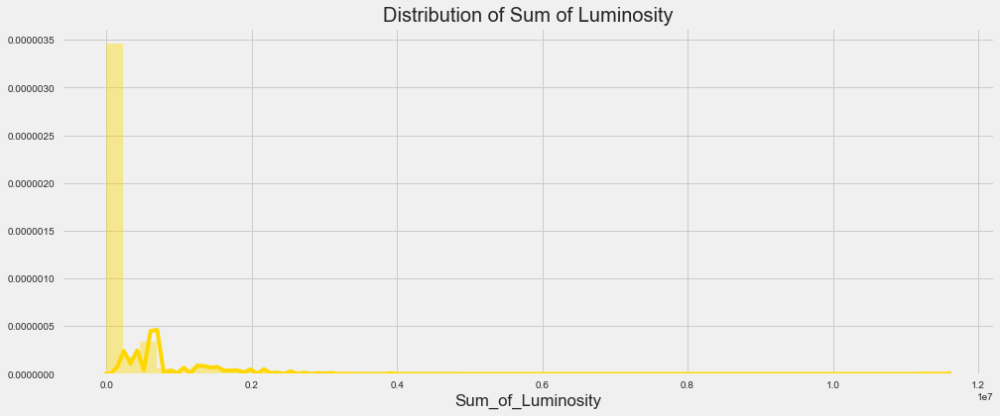

In [26]:
# lets check the distribution
sns.distplot(data['Sum_of_Luminosity'], 
             color = 'gold')
plt.title('Distribution of Sum of Luminosity', fontsize = 20)
plt.show()

**Now I apply the Box-Cox transformation that is available in scipy special module:**

In [27]:
# box cox transformation
skewed_features_df = skewed_features_df[abs(skewed_features_df) > 0.75]

from scipy.special import boxcox1p
lam = 0.15
cols = skewed_features_df.index

for c in cols:
    data[c] = boxcox1p(data[c], lam)


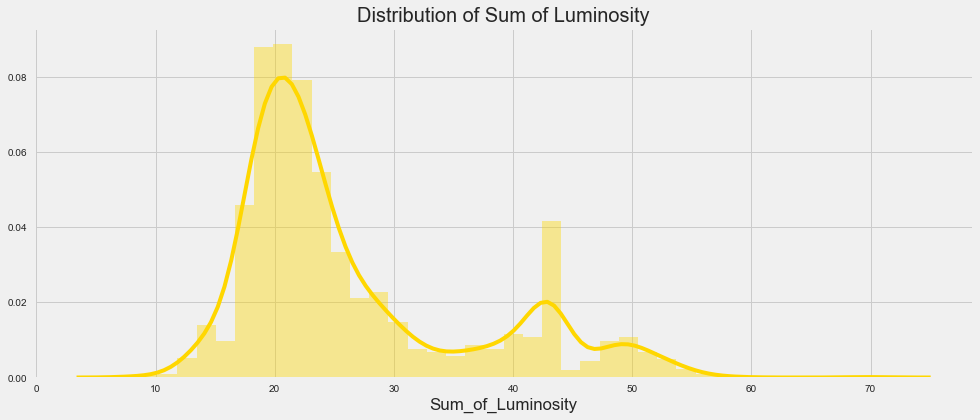

In [28]:
# lets check the distribution again
sns.distplot(data['Sum_of_Luminosity'], 
             color = 'gold')
plt.title('Distribution of Sum of Luminosity', fontsize = 20)
plt.show()

### Scaling the Features

* In many models the features need to be scaled for the model to perform well. Features with high values may effect the performance of many models. I will first separate the features and the target from our dataset and then apply the standard scaler on the features:

In [29]:
features = data.drop('Target', axis=1)
target = data['Target']

scaler = StandardScaler()
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)
features_scaled.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,-1.120654,-1.624646,-1.053504,-1.053558,-0.202883,-0.644736,0.124129,-0.285926,-0.052941,-1.242952,1.570439,1.223956,-1.223956,0.289100,-0.987606,-1.291934,-1.505449,-0.519330,-0.514829,0.773365,0.879804,0.007070,-0.953168,0.588165,1.103431,-0.932508,0.081904
1,0.543462,0.424953,0.825835,0.825841,-0.598533,-0.941552,-0.172465,-0.612327,0.156698,-0.340684,1.570439,1.223956,-1.223956,0.289100,1.424883,-0.216649,-1.391072,-0.540410,0.022933,0.649673,0.879804,-0.545086,-1.290349,0.208984,1.078679,-0.189662,-0.822893
2,0.734344,0.670078,0.358130,0.358094,-0.763687,-1.056348,-0.500687,-0.754645,0.508207,-0.227493,1.159610,1.223956,-1.223956,0.709498,1.963143,-0.493773,-0.844085,-0.538493,0.601860,0.577166,0.879804,-0.821769,-1.290349,-0.254863,0.949358,0.120198,-1.120785
3,0.756513,0.699744,-0.829160,-0.829220,-0.391966,-0.798942,0.142144,-0.395179,0.508207,-0.171469,-0.741385,-0.817023,0.817023,2.930634,1.325522,0.237590,-1.627061,-0.509754,-0.227850,0.773365,0.879804,-0.240087,-1.107330,0.607845,1.128961,-0.077449,-0.100192
4,1.088122,1.134374,-0.602734,-0.602464,1.020129,0.192685,1.770064,0.986082,-1.463624,-0.171469,-0.741385,-0.817023,0.817023,1.948007,-0.904454,0.289974,-2.060481,-0.368507,-1.369309,0.730848,0.879804,1.152609,-0.151148,1.982090,1.213815,-0.333646,1.189773


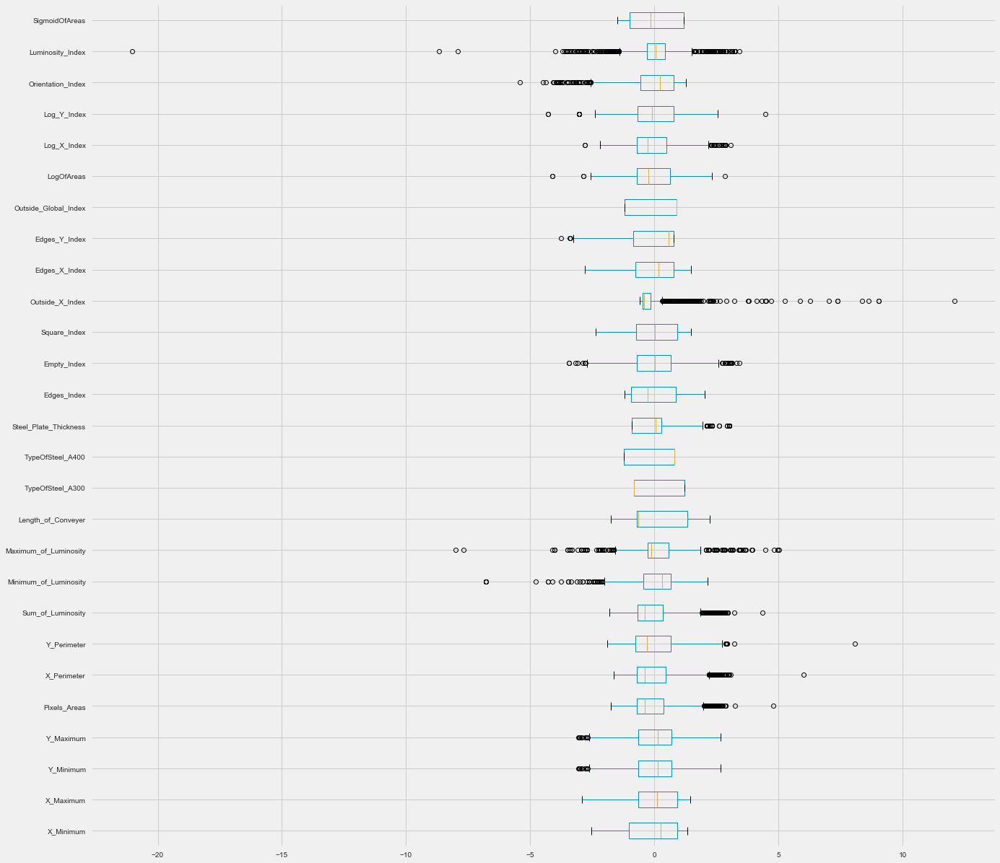

In [30]:
plt.rcParams['figure.figsize'] = (15, 25)
plt.style.use('fivethirtyeight')
data_boxplot = features_scaled.boxplot(return_type='dict',
                                       vert=False, 
                                       figsize=(20,20))

## Outliers Removal

In [31]:
# removing the outliers from the dataset for optimized training

print(features_scaled[features_scaled['Pixels_Areas']>4])
print(features_scaled[features_scaled['Sum_of_Luminosity']>4])
print(features_scaled[features_scaled['X_Perimeter']>4])
print(features_scaled[features_scaled['Y_Perimeter']>4])


     X_Minimum  X_Maximum  Y_Minimum  Y_Maximum  Pixels_Areas  X_Perimeter  \
391  -1.480626  -0.753254    1.34255    1.34719      4.781174     6.014558   

     Y_Perimeter  Sum_of_Luminosity  Minimum_of_Luminosity  \
391     8.086639           4.365205              -6.772315   

     Maximum_of_Luminosity  Length_of_Conveyer  TypeOfSteel_A300  \
391               1.356452           -0.871564         -0.817023   

     TypeOfSteel_A400  Steel_Plate_Thickness  Edges_Index  Empty_Index  \
391          0.817023              -0.923694    -1.079451     3.408884   

     Square_Index  Outside_X_Index  Edges_X_Index  Edges_Y_Index  \
391     -2.357974         1.453717      -2.803648       0.771152   

     Outside_Global_Index  LogOfAreas  Log_X_Index  Log_Y_Index  \
391              0.879804    2.829885       1.7046     4.479892   

     Orientation_Index  Luminosity_Index  SigmoidOfAreas  
391           1.267008         -1.785098        1.189773  
     X_Minimum  X_Maximum  Y_Minimum  Y_Ma

In [32]:
# multivariate method

data_scaled = features_scaled.copy()
data_scaled['Target'] = target

data_scaled['Target'] = pd.Categorical(data_scaled['Target'])
data_scaled['Target_Code'] = data_scaled.Target.cat.codes


In [33]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns,
                 themes = ['copper','summer','winter','spring','pink','bone']):
    sns.boxplot(data_scaled[column1], 
                data_scaled[column2],
                palette = themes)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('X…

In [34]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns[1:],
                 themes = ['summer','winter','spring','pink','bone']):
    sns.violinplot(data_scaled[column1], 
                data_scaled[column2],
                palette = themes)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('X…

In [35]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns[2:],
                 themes = ['winter','spring','pink','bone']):
    sns.boxenplot(data_scaled[column1], 
                data_scaled[column2],
                palette = themes)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('Y…

In [61]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns[3:],
                 themes = ['spring','pink','bone']):
    sns.swarmplot(data_scaled[column1], 
                data_scaled[column2],
                palette = themes)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('Y…

In [37]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns[4:],
                 themes = ['pink','bone']):
    sns.stripplot(data_scaled[column1], 
                data_scaled[column2],
                palette = themes)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('P…

In [38]:
# lets create an interactive plot for analysis

plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column1 = 'Target',
                 column2 = data_scaled.select_dtypes('number').columns[5:],
                 color = ['black','red','green']):
    sns.lineplot(data_scaled[column1], 
                data_scaled[column2],
                color = color)
    plt.show()

interactive(children=(Text(value='Target', description='column1'), Dropdown(description='column2', options=('X…

## DBSCAN for Outliers Removal

In [39]:
# preparing a dbscan model

dbscan_model = DBSCAN(eps=3.3, min_samples=7).fit(features_scaled)
print(Counter(dbscan_model.labels_))

Counter({0: 1846, -1: 95})


In [40]:
outliers = features_scaled[dbscan_model.labels_ == -1]
outliers.shape

(95, 27)

In [41]:
features_scaled.drop(outliers.index, axis=0, inplace=True)
target.drop(outliers.index, axis=0, inplace=True)
data_scaled.drop(outliers.index, axis=0, inplace=True)
features_scaled.shape

(1846, 27)

## Principal Component Analysis

In [42]:
# select the right number of features required to predict the values more precisely

pca = PCA(random_state=101)
features_pca = pca.fit_transform(features_scaled.values)
pd.DataFrame(pca.explained_variance_ratio_, columns=['Explained Variance Ratio'])

,Explained Variance Ratio
0,3.978569e-01
1,1.231157e-01
2,1.029524e-01
3,7.205521e-02
4,6.475156e-02
5,5.167241e-02
6,4.501012e-02
7,3.567701e-02
8,2.371999e-02
9,2.153396e-02


In [43]:
pca.explained_variance_ratio_[0:15].sum()

0.9931066464659039

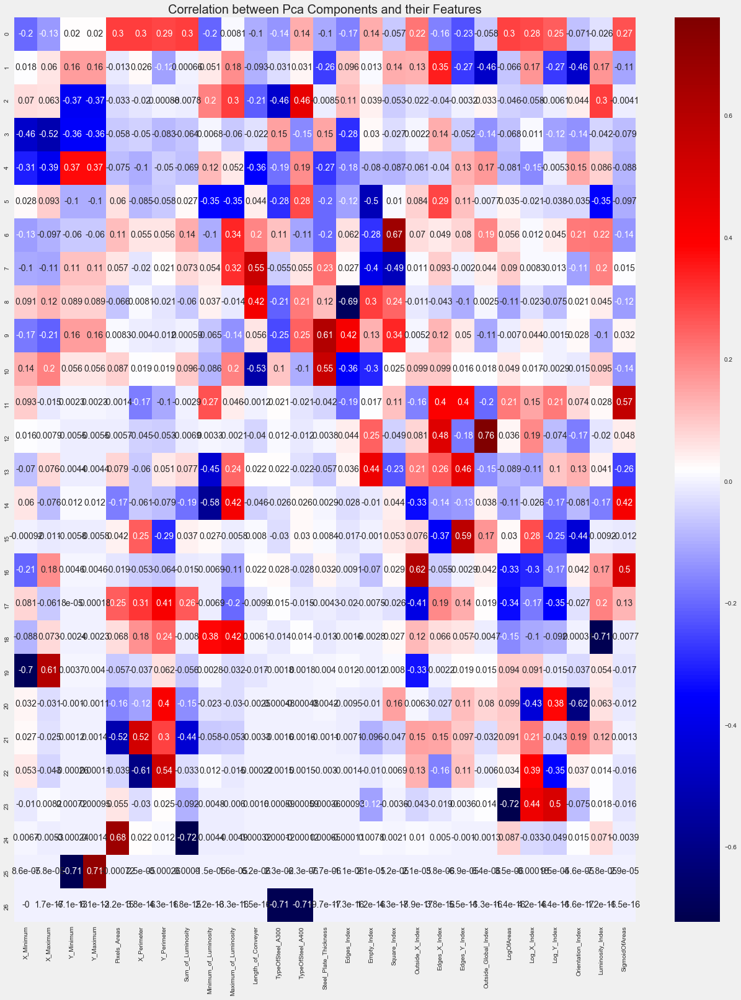

In [44]:
pca_components = pd.DataFrame(pca.components_, columns= features.columns)
plt.figure(figsize=(20,25))
sns.heatmap(pca_components,
            cmap='seismic', 
            annot = True)
plt.title('Correlation between Pca Components and their Features', fontsize = 20)
plt.show()

In [45]:
def pca_dataset(features, n_components):
    
    pca_n = PCA(n_components=n_components, random_state=101)
    features_pca_n = pca_n.fit_transform(features)
    
    column_pca = []
    for i in range(0,n_components):
        column_pca.append('Component'+np.str(i))
    return pd.DataFrame(features_pca_n, columns=column_pca)

In [46]:
data_pca15 = pca_dataset(features_scaled, n_components=15)
data_pca15['Target'] = target


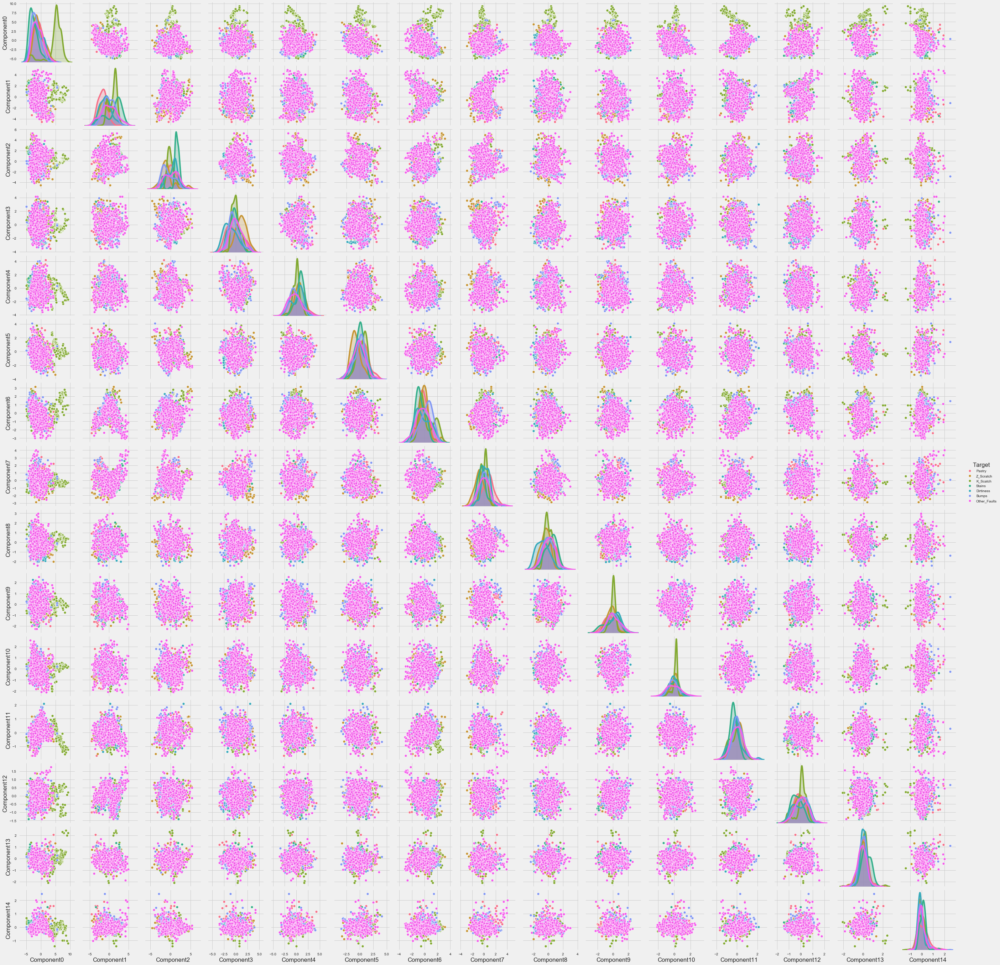

In [47]:
# lets check the pairplot for the principal component data
sns.pairplot(data_pca15, hue='Target')
plt.show()

In [48]:
pca.explained_variance_ratio_[0:5].sum()

0.7607317672293301

In [49]:
data_pca5 = pca_dataset(features_scaled, n_components=5)
data_pca5['Target'] = target

In [50]:
data_pca15['Target'] = pd.Categorical(data_pca15['Target'])
data_pca15['Target_Code'] = data_pca15.Target.cat.codes

data_pca5['Target'] = pd.Categorical(data_pca5['Target'])
data_pca5['Target_Code'] = data_pca5.Target.cat.codes

## Clustering Analysis

### Grouping with K-Means Clustering

* The K-Means clustering algorithm is a simple unsupervised algorithm that's used for quickly predicting groupings.

* Now let's take a look at the groups that we can identify by K-Means. We already know that we have 7 types of fault. Therefore, we can consider the number of clusters to be 7.

In [51]:
# lets make the model and check the parameters
kmeans_model = KMeans(n_clusters=7, random_state=54)
kmeans_model.fit(features_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=54, tol=0.0001, verbose=0)

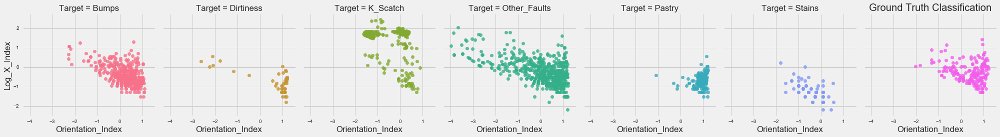

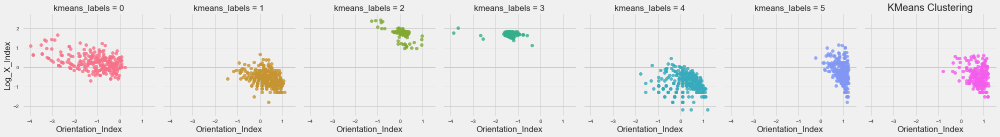

In [52]:
kmeans_labels = np.choose(kmeans_model.labels_, [0,1,2,3,4,5,6]).astype(np.int64)
data_scaled['kmeans_labels'] = kmeans_labels

color_themes = {0:'#8d99ae',1:'#ffe066', 2:'#f77f00',3:'#348aa7',4:'#bce784',5:'#ffcc99',  6:'#f25f5c'}


sns.lmplot(x='Orientation_Index',
           y='Log_X_Index',
           data=data_scaled,
           fit_reg=False,
           hue='Target',
           col='Target',
           size=4)
plt.title("Ground Truth Classification")

sns.lmplot(x='Orientation_Index',
           y='Log_X_Index',
           data=data_scaled,
           fit_reg=False,
           hue='kmeans_labels',
           col='kmeans_labels',
           size=4)
plt.title("KMeans Clustering")
plt.show()

In [53]:
print(classification_report(data_scaled['Target_Code'], kmeans_labels))

              precision    recall  f1-score   support

           0       0.21      0.14      0.17       396
           1       0.01      0.04      0.01        53
           2       0.97      0.34      0.51       374
           3       0.04      0.01      0.02       615
           4       0.06      0.14      0.09       149
           5       0.00      0.00      0.00        72
           6       0.45      0.54      0.49       187

    accuracy                           0.17      1846
   macro avg       0.25      0.17      0.18      1846
weighted avg       0.31      0.17      0.20      1846



In [54]:
kmeans_model_pca15 = KMeans(n_clusters=7, random_state=54)
kmeans_model_pca15.fit(data_pca15.drop(['Target','Target_Code'], axis=1))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=54, tol=0.0001, verbose=0)

In [55]:
kmeans_labels_pca15 = np.choose(kmeans_model.labels_, [0,1,2,3,4,5,6]).astype(np.int64)
data_pca15['kmeans_labels'] = kmeans_labels_pca15

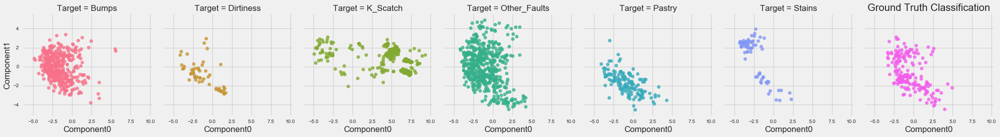

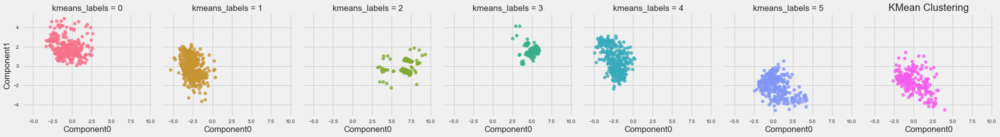

In [56]:
sns.lmplot(x='Component0',
           y='Component1',
           data=data_pca15,
           fit_reg=False, 
           hue='Target',
           col='Target',
           size=4)
plt.title("Ground Truth Classification")

sns.lmplot(x='Component0',
           y='Component1',
           data=data_pca15, 
           fit_reg=False, 
           hue='kmeans_labels',
           col='kmeans_labels',
           size=4)
plt.title("KMean Clustering")
plt.show()

In [57]:
print(classification_report(data_pca15['Target_Code'], kmeans_model_pca15.labels_))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00        91
           0       0.13      0.10      0.11       396
           1       0.03      0.25      0.06        53
           2       0.13      0.12      0.12       374
           3       0.21      0.09      0.12       524
           4       0.00      0.00      0.00       149
           5       0.00      0.00      0.00        72
           6       0.15      0.22      0.18       187

    accuracy                           0.10      1846
   macro avg       0.08      0.10      0.08      1846
weighted avg       0.13      0.10      0.10      1846



It can be seen from the results that the 15 PCA components have led to much better precision and recall in K-Means. Let's also try with the 5 PCA components:

In [58]:
kmeans_model_pca5 = KMeans(n_clusters=7, random_state=54)
kmeans_model_pca5.fit(data_pca5.drop(['Target','Target_Code'], axis=1))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=54, tol=0.0001, verbose=0)

In [59]:
print(classification_report(data_pca5['Target_Code'], kmeans_model_pca15.labels_))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00        91
           0       0.13      0.10      0.11       396
           1       0.03      0.25      0.06        53
           2       0.13      0.12      0.12       374
           3       0.21      0.09      0.12       524
           4       0.00      0.00      0.00       149
           5       0.00      0.00      0.00        72
           6       0.15      0.22      0.18       187

    accuracy                           0.10      1846
   macro avg       0.08      0.10      0.08      1846
weighted avg       0.13      0.10      0.10      1846



## Hierarchial Clustering Analysis

In [ ]:
origina_data.columns

In [ ]:
original_features = origina_data.drop(['Target'], axis=1).copy()
origina_data['Target'] = pd.Categorical(origina_data['Target'])
origina_data['Target_Code'] = origina_data.Target.cat.codes

In [ ]:

linkage_model = linkage(original_features, method='ward')
dendrogram(linkage_model, truncate_mode='lastp', p=12, leaf_rotation=45, leaf_font_size=12, show_contracted=True)
plt.title('Truncated Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')

plt.axhline(y=0.4*10**(8))
plt.axhline(y=0.2*10**(8))
plt.title('Visualizing the Dendrograms', fontsize = 20)
plt.show()

In [ ]:
k = 7
h_clustering = AgglomerativeClustering(n_clusters=k, 
                                       affinity='euclidean', 
                                       linkage='ward')
h_clustering.fit(original_features)

accuracy_score(origina_data['Target_Code'], h_clustering.labels_)

In [ ]:
h_clustering = AgglomerativeClustering(n_clusters=k,
                                       affinity='manhattan',
                                       linkage='complete' )
h_clustering.fit(original_features)

accuracy_score(origina_data['Target_Code'], h_clustering.labels_)

In [ ]:
h_clustering = AgglomerativeClustering(n_clusters=k, 
                                       affinity='manhattan',
                                       linkage='average')
h_clustering.fit(original_features)

accuracy_score(origina_data['Target_Code'], h_clustering.labels_)

In [ ]:
k = 7
h_clustering_pca5 = AgglomerativeClustering(n_clusters=k,
                                            affinity='euclidean',
                                            linkage='ward' )
h_clustering_pca5.fit(data_pca5.drop(['Target','Target_Code'], axis=1))

accuracy_score(data_pca5['Target_Code'], h_clustering_pca5.labels_)


In [4]:
# lets read the dataset
data = pd.read_csv('faults.csv')

# check the head of the dataset
pd.set_option('max_columns', 100)
data.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


In [5]:
targets = data.iloc[:, 27:35]
data.drop(targets.columns, axis=1, inplace=True)
data['Target'] = targets.idxmax(1)
data.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Target
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,Pastry
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,Pastry
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,Pastry
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,Pastry
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,Pastry


In [6]:
# lets's split the dataset into dependent and independent variables
x = data.iloc[:, :-1]
y = data.iloc[:, -1]

print("Shape of X :", x.shape)
print("Shape of Y :", y.shape)

Shape of X : (1941, 27)
Shape of Y : (1941,)


In [8]:
# lets split them into train and test set

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

# lets check the shapes of the dataset
print("Shape of X_train :", x_train.shape)
print("Shape of y_train :", y_train.shape)
print("Shape of X_test :", x_test.shape)
print("Shape of y_test :", y_test.shape)

Shape of X_train : (1552, 27)
Shape of y_train : (1552,)
Shape of X_test : (389, 27)
Shape of y_test : (389,)


In [9]:
# lets standardize the values of the dataset

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x_train_std = sc.fit_transform(x_train)
x_test_std = sc.transform(x_test)


Training Accuracy : 1.0
Testing Accuracy : 1.0


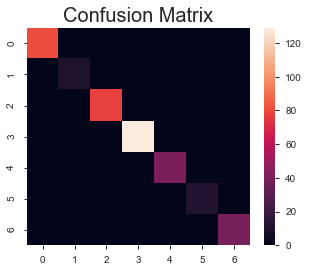

              precision    recall  f1-score   support

       Bumps       1.00      1.00      1.00        81
   Dirtiness       1.00      1.00      1.00        10
    K_Scatch       1.00      1.00      1.00        78
Other_Faults       1.00      1.00      1.00       129
      Pastry       1.00      1.00      1.00        40
      Stains       1.00      1.00      1.00        12
   Z_Scratch       1.00      1.00      1.00        39

    accuracy                           1.00       389
   macro avg       1.00      1.00      1.00       389
weighted avg       1.00      1.00      1.00       389



In [22]:
# Applying Random Forest Classifier 

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

model = RandomForestClassifier()
model.fit(x, y)
y_pred = model.predict(x_test)

# lets check the accuracy
print("Training Accuracy :", model.score(x_train, y_train))
print("Testing Accuracy :", model.score(x_test, y_test))

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.rcParams['figure.figsize'] = (5, 4)
sns.heatmap(cm)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()

# classification report
cr = classification_report(y_test, y_pred)
print(cr)

In [12]:
# lets also print the Predictions 
y_pred = pd.DataFrame(y_pred)
y_pred.style.bar(color = 'gold', align = 'mid')

,0
0,Stains
1,K_Scatch
2,K_Scatch
3,Z_Scratch
4,Bumps
5,Dirtiness
6,K_Scatch
7,Other_Faults
8,Pastry
9,Other_Faults


## Real Time Prediction

In [17]:
data.sample(5)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Target
538,43,186,143167,143219,4403,215,115,457632,38,126,1360,0,1,40,0.0632,0.4079,0.3636,0.1051,0.6651,0.4522,0.0,3.6437,2.1553,1.7160,-0.6364,-0.1880,1.0000,K_Scatch
1669,630,649,5015327,5015357,249,32,31,17250,49,87,1356,1,0,200,0.9292,0.5632,0.6333,0.0140,0.5938,0.9677,1.0,2.3962,1.2787,1.4771,0.3667,-0.4588,0.8563,Other_Faults
1835,100,107,108596,108604,39,11,8,6999,172,189,1353,0,1,200,0.1478,0.3036,0.8750,0.0052,0.6364,1.0000,1.0,1.5911,0.8451,0.9031,0.1250,0.4020,0.1622,Other_Faults
195,49,71,573049,573118,884,106,98,83716,77,118,1356,1,0,70,0.0723,0.4177,0.3188,0.0162,0.2076,0.7041,1.0,2.9464,1.3424,1.8389,0.6812,-0.2601,0.9997,Z_Scratch
1870,1341,1409,2794140,2794143,173,68,11,21612,65,174,1692,1,0,70,0.3345,0.1520,0.0441,0.0402,1.0000,0.2727,0.0,2.2380,1.8325,0.4771,-0.9559,-0.0240,0.3419,Other_Faults


In [18]:
data.describe()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
count,1941.000000,1941.000000,1.941000e+03,1.941000e+03,1941.000000,1941.000000,1941.000000,1.941000e+03,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000
mean,571.136012,617.964451,1.650685e+06,1.650739e+06,1893.878413,111.855229,82.965997,2.063121e+05,84.548686,130.193715,1459.160227,0.400309,0.599691,78.737764,0.331715,0.414203,0.570767,0.033361,0.610529,0.813472,0.575734,2.492388,1.335686,1.403271,0.083288,-0.131305,0.585420
std,520.690671,497.627410,1.774578e+06,1.774590e+06,5168.459560,301.209187,426.482879,5.122936e+05,32.134276,18.690992,144.577823,0.490087,0.490087,55.086032,0.299712,0.137261,0.271058,0.058961,0.243277,0.234274,0.482352,0.788930,0.481612,0.454345,0.500868,0.148767,0.339452
min,0.000000,4.000000,6.712000e+03,6.724000e+03,2.000000,2.000000,1.000000,2.500000e+02,0.000000,37.000000,1227.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.008300,0.001500,0.014400,0.048400,0.000000,0.301000,0.301000,0.000000,-0.991000,-0.998900,0.119000
25%,51.000000,192.000000,4.712530e+05,4.712810e+05,84.000000,15.000000,13.000000,9.522000e+03,63.000000,124.000000,1358.000000,0.000000,0.000000,40.000000,0.060400,0.315800,0.361300,0.006600,0.411800,0.596800,0.000000,1.924300,1.000000,1.079200,-0.333300,-0.195000,0.248200
50%,435.000000,467.000000,1.204128e+06,1.204136e+06,174.000000,26.000000,25.000000,1.920200e+04,90.000000,127.000000,1364.000000,0.000000,1.000000,70.000000,0.227300,0.412100,0.555600,0.010100,0.636400,0.947400,1.000000,2.240600,1.176100,1.322200,0.095200,-0.133000,0.506300
75%,1053.000000,1072.000000,2.183073e+06,2.183084e+06,822.000000,84.000000,83.000000,8.301100e+04,106.000000,140.000000,1650.000000,1.000000,1.000000,80.000000,0.573800,0.501600,0.818200,0.023500,0.800000,1.000000,1.000000,2.914900,1.518500,1.732400,0.511600,-0.066600,0.999800
max,1705.000000,1713.000000,1.298766e+07,1.298769e+07,152655.000000,10449.000000,18152.000000,1.159141e+07,203.000000,253.000000,1794.000000,1.000000,1.000000,300.000000,0.995200,0.943900,1.000000,0.875900,1.000000,1.000000,1.000000,5.183700,3.074100,4.258700,0.991700,0.642100,1.000000


In [16]:
data.columns

Index(['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas', 'Target'],
      dtype='object')

In [19]:
# inverse transforming the values
prediction = model.predict(sc.transform(np.array([[45, 54, 286145, 274561, 278, 20, 50, 26001, 76, 120, 1785,
                                                  2, 0, 95, 0.05, 0.5, 0.2, 0.3, 0.0005, 0.45, 1.0, 1.785, 0.95,
                                                  1.65, 0.995, -0.39, 0.65]])))

In [20]:
# lets print the Result
print("The Type of Defect is :", prediction)

The Type of Defect is : ['Other_Faults']
